# Bluebook for Bulldozers

## Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv(
    '../data/processed/data-wrangling.csv',
    low_memory=False
)

In [3]:
df.head(3).T

,0,1,2
SalesID,1646770,1821514,1505138
SalePrice,9500.0,14000.0,50000.0
MachineID,1126363,1194089,1473654
ModelID,8434,10150,4139
datasource,132,132,132
auctioneerID,18.0,99.0,99.0
YearMade,1974,1980,1978
MachineHoursCurrentMeter,NaN,NaN,NaN
UsageBand,NaN,NaN,NaN
fiModelDesc,TD20,A66,D7G


### Feature correlation

<AxesSubplot:>

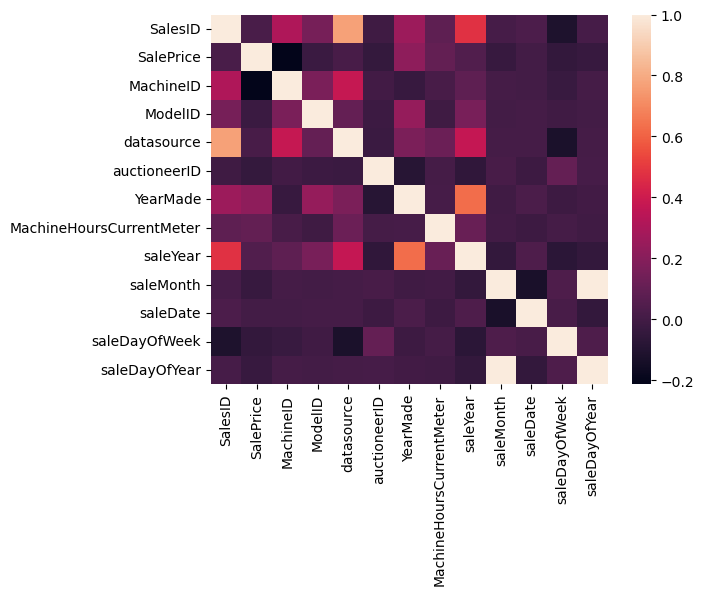

In [4]:
sns.heatmap(df.corr())

Noticing mild correlation between `YearMade` and our target variable, `SalePrice`, which is expected, as newer vehicles generally command a higher price.

Also, noticing strong correlation between `SalesID` and `datasource`, although that doesn't reveal any interesting trends about this dataset, as these are categorical values that do not describe the vehicle.

### Outliers

<AxesSubplot:xlabel='SalePrice'>

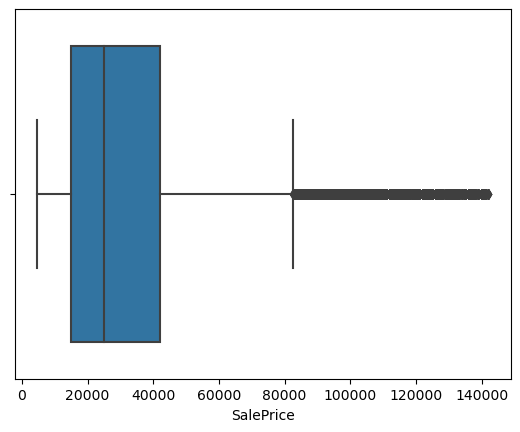

In [5]:
sns.boxplot(x=df.SalePrice)

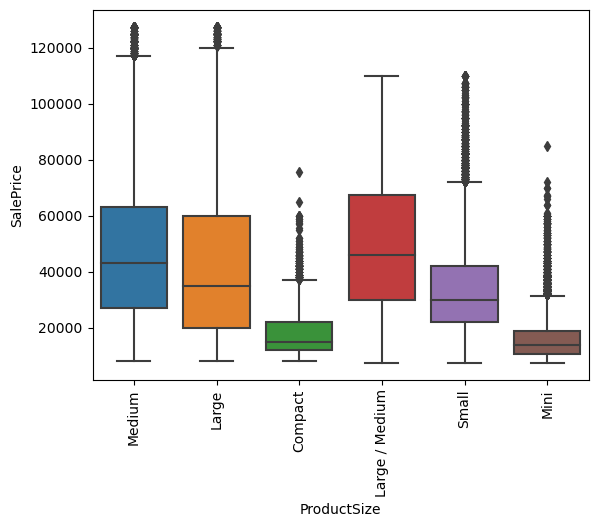

In [6]:
_ = sns.boxplot(x='ProductSize', y='SalePrice', data=df)
_.set_xticklabels(_.get_xticklabels(),rotation=90)
_ = plt.xlabel('ProductSize')
_ = plt.ylabel('SalePrice')
plt.show()

<AxesSubplot:xlabel='SalePrice', ylabel='saleYear'>

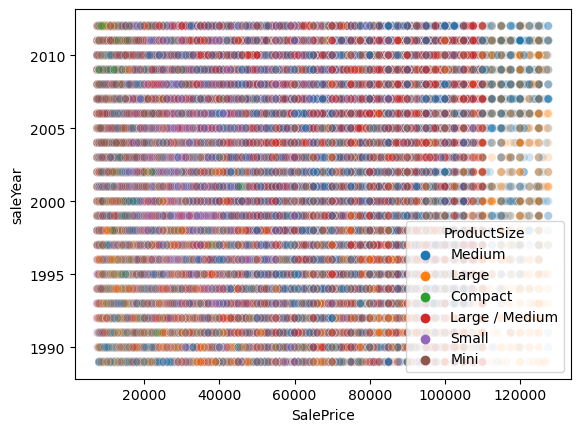

In [7]:
sns.scatterplot(
    data=df,
    hue='ProductSize',
    x='SalePrice',
    y='saleYear',
    alpha=0.2
)

Noticing a rather peculiar gap in our dataset during the early 2000s, as well as an imbalance in the data -- we have far more observations of sales during from ~2005 onwarnd than we do before 2005.

<AxesSubplot:xlabel='SalePrice'>

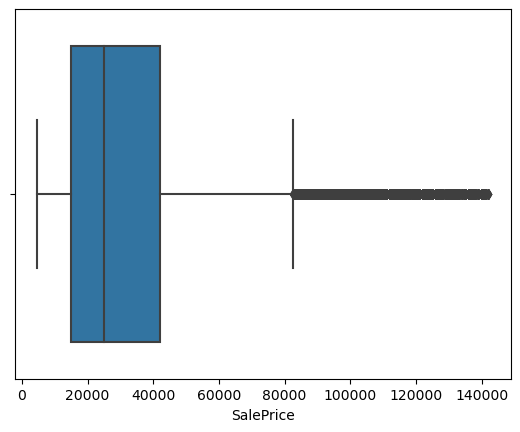

In [8]:
sns.boxplot(x=df.SalePrice)

### Generate Automated Pandas Profiling Report

In [9]:
profile = ProfileReport(df, title="Bluebook for bulldozers")
profile.to_file("../reports/bulldozer_profiling.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/Users/gregmckenzie/opt/anaconda3/lib/python3.9/site-packages/pandas_profiling/model/correlations.py:67: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/pandas-profiling/issues
(include the error message: 'No data; `observed` has size 0.')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Transmission, Turbocharged, Blade_Extension, Engine_Horsepower, Hydraulics_Flow, Undercarriage_Pad_Width, Stick_Length, Pattern_Changer, Backhoe_Mounting, Travel_Controls, Differential_Type, and Steering_Controls are quite imbalanced.  I think these values may need to be stratified in order to measure them correctly.

In [10]:
df.to_csv('../data/processed/exploratory-data-analysis.csv', index=False)